In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install pytorch-transformers

     |████████████████████████████████| 184kB 8.8MB/s 
     |████████████████████████████████| 1.0MB 58.5MB/s 
     |████████████████████████████████| 645kB 53.6MB/s 
     |████████████████████████████████| 860kB 48.6MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.35-cp36-none-any.whl size=883999 sha256=1f7a663527c806b2e1c80a9513d8c768bb37a374cb7cf45391f338d4e9a4fd47
  Stored in directory: /root/.cache/pip/wheels/63/2a/db/63e2909042c634ef551d0d9ac825b2b0b32dede4a6d87ddc94
Successfully built sacremoses


In [4]:
%%writefile utils.py 

# coding=utf-8
# Copyright 2018 The Google AI Language Team Authors and The HuggingFace Inc. team.
# Copyright (c) 2018, NVIDIA CORPORATION.  All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
""" BERT classification fine-tuning: utilities to work with GLUE tasks """

from __future__ import absolute_import, division, print_function

import csv
import logging
import os
import sys
from io import open

from scipy.stats import pearsonr, spearmanr
from sklearn.metrics import matthews_corrcoef, f1_score

from multiprocessing import Pool, cpu_count
from tqdm import tqdm

logger = logging.getLogger(__name__)
csv.field_size_limit(2147483647)

class InputExample(object):
    """A single training/test example for simple sequence classification."""

    def __init__(self, guid, text_a, text_b=None, label=None):
        """Constructs a InputExample.

        Args:
            guid: Unique id for the example.
            text_a: string. The untokenized text of the first sequence. For single
            sequence tasks, only this sequence must be specified.
            text_b: (Optional) string. The untokenized text of the second sequence.
            Only must be specified for sequence pair tasks.
            label: (Optional) string. The label of the example. This should be
            specified for train and dev examples, but not for test examples.
        """
        self.guid = guid
        self.text_a = text_a
        self.text_b = text_b
        self.label = label


class InputFeatures(object):
    """A single set of features of data."""

    def __init__(self, input_ids, input_mask, segment_ids, label_id):
        self.input_ids = input_ids
        self.input_mask = input_mask
        self.segment_ids = segment_ids
        self.label_id = label_id


class DataProcessor(object):
    """Base class for data converters for sequence classification data sets."""

    def get_train_examples(self, data_dir):
        """Gets a collection of `InputExample`s for the train set."""
        raise NotImplementedError()

    def get_dev_examples(self, data_dir):
        """Gets a collection of `InputExample`s for the dev set."""
        raise NotImplementedError()

    def get_labels(self):
        """Gets the list of labels for this data set."""
        raise NotImplementedError()

    @classmethod
    def _read_tsv(cls, input_file, quotechar=None):
        """Reads a tab separated value file."""
        with open(input_file, "r", encoding="utf-8-sig") as f:
            reader = csv.reader(f, delimiter="\t", quotechar=quotechar)
            lines = []
            for line in reader:
                if sys.version_info[0] == 2:
                    line = list(unicode(cell, 'utf-8') for cell in line)
                lines.append(line)
            return lines


class BinaryProcessor(DataProcessor):
    """Processor for the binary data sets"""

    def get_train_examples(self, data_dir):
        """See base class."""
        return self._create_examples(
            self._read_tsv(os.path.join(data_dir, "train.tsv")), "train")

    def get_dev_examples(self, data_dir):
        """See base class."""
        return self._create_examples(
            self._read_tsv(os.path.join(data_dir, "dev.tsv")), "dev")

    def get_labels(self):
        """See base class."""
        return ["0", "1"]

    def _create_examples(self, lines, set_type):
        """Creates examples for the training and dev sets."""
        examples = []
        for (i, line) in enumerate(lines):
            guid = "%s-%s" % (set_type, i)
            text_a = line[3]
            label = line[1]
            examples.append(
                InputExample(guid=guid, text_a=text_a, text_b=None, label=label))
        return examples


def convert_example_to_feature(example_row, pad_token=0,
sequence_a_segment_id=0, sequence_b_segment_id=1,
cls_token_segment_id=1, pad_token_segment_id=0,
mask_padding_with_zero=True):
    example, label_map, max_seq_length, tokenizer, output_mode, cls_token_at_end, cls_token, sep_token, cls_token_segment_id, pad_on_left, pad_token_segment_id = example_row

    tokens_a = tokenizer.tokenize(example.text_a)

    tokens_b = None
    if example.text_b:
        tokens_b = tokenizer.tokenize(example.text_b)
        # Modifies `tokens_a` and `tokens_b` in place so that the total
        # length is less than the specified length.
        # Account for [CLS], [SEP], [SEP] with "- 3"
        _truncate_seq_pair(tokens_a, tokens_b, max_seq_length - 3)
    else:
        # Account for [CLS] and [SEP] with "- 2"
        if len(tokens_a) > max_seq_length - 2:
            tokens_a = tokens_a[:(max_seq_length - 2)]

    # The convention in BERT is:
    # (a) For sequence pairs:
    #  tokens:   [CLS] is this jack ##son ##ville ? [SEP] no it is not . [SEP]
    #  type_ids:   0   0  0    0    0     0       0   0   1  1  1  1   1   1
    # (b) For single sequences:
    #  tokens:   [CLS] the dog is hairy . [SEP]
    #  type_ids:   0   0   0   0  0     0   0
    #
    # Where "type_ids" are used to indicate whether this is the first
    # sequence or the second sequence. The embedding vectors for `type=0` and
    # `type=1` were learned during pre-training and are added to the wordpiece
    # embedding vector (and position vector). This is not *strictly* necessary
    # since the [SEP] token unambiguously separates the sequences, but it makes
    # it easier for the model to learn the concept of sequences.
    #
    # For classification tasks, the first vector (corresponding to [CLS]) is
    # used as as the "sentence vector". Note that this only makes sense because
    # the entire model is fine-tuned.
    tokens = tokens_a + [sep_token]
    segment_ids = [sequence_a_segment_id] * len(tokens)

    if tokens_b:
        tokens += tokens_b + [sep_token]
        segment_ids += [sequence_b_segment_id] * (len(tokens_b) + 1)

    if cls_token_at_end:
        tokens = tokens + [cls_token]
        segment_ids = segment_ids + [cls_token_segment_id]
    else:
        tokens = [cls_token] + tokens
        segment_ids = [cls_token_segment_id] + segment_ids

    input_ids = tokenizer.convert_tokens_to_ids(tokens)

    # The mask has 1 for real tokens and 0 for padding tokens. Only real
    # tokens are attended to.
    input_mask = [1 if mask_padding_with_zero else 0] * len(input_ids)

    # Zero-pad up to the sequence length.
    padding_length = max_seq_length - len(input_ids)
    if pad_on_left:
        input_ids = ([pad_token] * padding_length) + input_ids
        input_mask = ([0 if mask_padding_with_zero else 1] * padding_length) + input_mask
        segment_ids = ([pad_token_segment_id] * padding_length) + segment_ids
    else:
        input_ids = input_ids + ([pad_token] * padding_length)
        input_mask = input_mask + ([0 if mask_padding_with_zero else 1] * padding_length)
        segment_ids = segment_ids + ([pad_token_segment_id] * padding_length)

    assert len(input_ids) == max_seq_length
    assert len(input_mask) == max_seq_length
    assert len(segment_ids) == max_seq_length

    if output_mode == "classification":
        label_id = label_map[example.label]
    elif output_mode == "regression":
        label_id = float(example.label)
    else:
        raise KeyError(output_mode)

    return InputFeatures(input_ids=input_ids,
                        input_mask=input_mask,
                        segment_ids=segment_ids,
                        label_id=label_id)
    

def convert_examples_to_features(examples, label_list, max_seq_length,
                                 tokenizer, output_mode,
                                 cls_token_at_end=False, pad_on_left=False,
                                 cls_token='[CLS]', sep_token='[SEP]', pad_token=0,
                                 sequence_a_segment_id=0, sequence_b_segment_id=1,
                                 cls_token_segment_id=1, pad_token_segment_id=0,
                                 mask_padding_with_zero=True,
                                #  process_count=cpu_count() - 2):
                                 process_count = cpu_count()):
    """ Loads a data file into a list of `InputBatch`s
        `cls_token_at_end` define the location of the CLS token:
            - False (Default, BERT/XLM pattern): [CLS] + A + [SEP] + B + [SEP]
            - True (XLNet/GPT pattern): A + [SEP] + B + [SEP] + [CLS]
        `cls_token_segment_id` define the segment id associated to the CLS token (0 for BERT, 2 for XLNet)
    """

    label_map = {label : i for i, label in enumerate(label_list)}

    examples = [(example, label_map, max_seq_length, tokenizer, output_mode, cls_token_at_end, cls_token, sep_token, cls_token_segment_id, pad_on_left, pad_token_segment_id) for example in examples]

    with Pool(process_count) as p:
        features = list(tqdm(p.imap(convert_example_to_feature, examples, chunksize=100), total=len(examples)))

    return features



def _truncate_seq_pair(tokens_a, tokens_b, max_length):
    """Truncates a sequence pair in place to the maximum length."""

    # This is a simple heuristic which will always truncate the longer sequence
    # one token at a time. This makes more sense than truncating an equal percent
    # of tokens from each, since if one sequence is very short then each token
    # that's truncated likely contains more information than a longer sequence.
    while True:
        total_length = len(tokens_a) + len(tokens_b)
        if total_length <= max_length:
            break
        if len(tokens_a) > len(tokens_b):
            tokens_a.pop()
        else:
            tokens_b.pop()


processors = {
    "binary": BinaryProcessor
}

output_modes = {
    "binary": "classification"
}

GLUE_TASKS_NUM_LABELS = {
    "binary": 2
}


Writing utils.py


In [0]:
import pandas as pd
import os
import json
# import bert.extract_features as xf
# import tokenization
class DataPreProcessing(object):
    def __init__(self):
        self.data_set_loc = "/content/drive/My Drive/w266 Final Project/bert/dataset"
        self.fake_news_loc = os.path.join( "..",self.data_set_loc, "BuzzFeed",  "FakeNewsContent")
        self.real_news_loc = os.path.join( "..", self.data_set_loc, "BuzzFeed", "RealNewsContent")
        self.fake_news_desc_list = []
        self.real_news_desc_list = []


    def extract_desc_from_files(self, file_path, data_list):
        with open(file_path) as fd:
            json_data = json.load(fd)
           # data_list.append(xf.convert_examples_to_features(json_data['text'], 1, tokenizer))
            data_list.append(json_data['text'].replace("\n", " "))
    def read_json_news_files(self):
        for file in os.listdir(self.fake_news_loc):
            if file.endswith(".json"):
                self.extract_desc_from_files(os.path.join(self.fake_news_loc, file), self.fake_news_desc_list)
        for file in os.listdir(self.real_news_loc):
            if file.endswith(".json"):
                self.extract_desc_from_files(os.path.join(self.real_news_loc, file), self.real_news_desc_list)
        fake_news_df = pd.DataFrame({0: self.fake_news_desc_list})
        fake_news_df.to_csv("/content/drive/My Drive/w266 Final Project/bert/dataset/fake_news.csv", index=False, header=False)
        fake_news_df.columns = ["text"]
        fake_news_df["label"] = "1" #fake news
        real_news_df = pd.DataFrame({0: self.real_news_desc_list})
        real_news_df.columns = ["text"]
        real_news_df["label"] = "0" #real news
        combined_df = pd.concat([real_news_df, fake_news_df])
        combined_df.to_csv("/content/drive/My Drive/w266 Final Project/bert/dataset/news.csv", index=False, header=False)
        a=1

    # def test_bert(self):
    #     examples = xf.read_examples(os.path.join(self.fake_news_loc,"fake_news.csv"))
    #     features = xf.convert_examples_to_features(examples, 91, tokenization.Tokenizer)
    #     a=1


ob = DataPreProcessing()
ob.read_json_news_files() #creates news.csv file in dataset directory


In [6]:
# NEED TO CREATE Train/Val/Test with data

from sklearn.model_selection import train_test_split

prefix = "/content/drive/My Drive/w266 Final Project/bert/dataset/"

all_df = pd.read_csv(prefix + 'news.csv', header=None)

all_df.head()

,0,1
0,"On Saturday, September 17 at 8:30 pm EST, an e...",0
1,Less than a day after protests over the police...,0
2,"Obama To UN: ‘Giving Up Liberty, Enhances Secu...",0
3,Getty Images Wealth Of Nations Trump vs. Clint...,0
4,President Obama today vetoed a bill that would...,0


In [7]:
news_df = pd.DataFrame({
    'id':range(len(all_df)),
    'label':all_df[1],
    'alpha':['a']*all_df.shape[0],
    'text': all_df[0].replace(r'\n', ' ', regex=True)
})
news_df.head()

,id,label,alpha,text
0,0,0,a,"On Saturday, September 17 at 8:30 pm EST, an e..."
1,1,0,a,Less than a day after protests over the police...
2,2,0,a,"Obama To UN: ‘Giving Up Liberty, Enhances Secu..."
3,3,0,a,Getty Images Wealth Of Nations Trump vs. Clint...
4,4,0,a,President Obama today vetoed a bill that would...


In [8]:
#  X_train, X_test, y_train, y_test = train_test_split(news_df.loc[:,'text'], news_df.loc[:,'label'], test_size=0.33, random_state=42)
from sklearn.model_selection import train_test_split
train, test = train_test_split(news_df, test_size = 0.33)
train.reset_index(drop=True, inplace=True)
print(train.head())
print(len(train))

test.reset_index(drop=True, inplace=True)
print(len(test))
test.head()

    id  label alpha                                               text
0    5      0     a  CHAOS! NC Protest MOB Ambushes Female Truck Dr...
1   97      1     a  Back when the news first broke about the pay-t...
2  124      1     a  Dolly Kyle has written a scathing “tell all” b...
3   65      0     a  Under the Radar Blog Archives Select Date… Jul...
4  180      1     a    There’s a lot to be discussed about last nig...
121
61


,id,label,alpha,text
0,116,1,a,196 SHARES Facebook Twitter For a little over...
1,98,1,a,"On September 15, Hillary “apparently” held a r..."
2,144,1,a,"7k SHARES SHARE THIS STORY Last night, the ci..."
3,150,1,a,13.6k SHARES SHARE THIS STORY Hillary Clinton...
4,148,1,a,11.3k SHARES SHARE THIS STORY During a Republ...


# New Section

# New Section

In [9]:
import numpy as np

label_list = np.unique(train['label'])
print(label_list)

[0 1]


In [10]:
!nvidia-smi

Fri Dec  6 02:18:19 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [11]:
!git clone -b master https://github.com/charles9n/bert-sklearn
!cd bert-sklearn; pip install .
import os
os.chdir("bert-sklearn")
print(os.listdir())

Cloning into 'bert-sklearn'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 259 (delta 3), reused 2 (delta 0), pack-reused 247
Receiving objects: 100% (259/259), 519.36 KiB | 1.30 MiB/s, done.
Resolving deltas: 100% (125/125), done.
Processing /content/bert-sklearn
  Created wheel for bert-sklearn: filename=bert_sklearn-0.3.1-cp36-none-any.whl size=54234 sha256=fba831526441be29dd141e9b8748f7291ab690cde2941bf9aa20bce0cc9d7203
  Stored in directory: /root/.cache/pip/wheels/61/95/c6/5790aae8fb377f5ff356dbe58205aab28858595d6bff8197d0
Successfully built bert-sklearn
['bert_sklearn', 'glue_examples', 'Options.md', 'setup.py', 'other_examples', 'tests', 'README.md', 'demo.ipynb', 'demo_tuning_hyperparams.ipynb', '.git', 'LICENSE']


In [12]:
import torch
print('pytorch version:', torch.__version__)
print('GPU:',torch.cuda.get_device_name(0))

pytorch version: 1.3.1
GPU: Tesla T4


In [0]:
import os
import math
import random
import csv
import sys

import numpy as np
import pandas as pd
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
import statistics as stats

from bert_sklearn import BertClassifier
from bert_sklearn import BertRegressor
from bert_sklearn import BertTokenClassifier
from bert_sklearn import load_model

def read_tsv(filename, quotechar=None):
    with open(filename, "r", encoding='utf-8') as f:
        return list(csv.reader(f, delimiter="\t", quotechar=quotechar))   

def flatten(l):
    return [item for sublist in l for item in sublist]

def read_CoNLL2003_format(filename, idx=3):
    """Read file in CoNLL-2003 shared task format"""
    
    # read file
    lines =  open(filename).read().strip()   
    
    # find sentence-like boundaries
    lines = lines.split("\n\n")  
    
     # split on newlines
    lines = [line.split("\n") for line in lines]
    
    # get tokens
    tokens = [[l.split()[0] for l in line] for line in lines]
    
    # get labels/tags
    labels = [[l.split()[idx] for l in line] for line in lines]
    
    #convert to df
    data= {'tokens': tokens, 'labels': labels}
    df=pd.DataFrame(data=data)
    
    return df

In [0]:
X_train = train['text']
y_train = train['label']

# use the dev set for testing
X_test = test['text']
y_test = test['label']

In [15]:
model = BertClassifier(max_seq_length=64, train_batch_size=16, epochs=10)
model

Building sklearn text classifier...


BertClassifier(bert_config_json=None, bert_model='bert-base-uncased',
               bert_vocab=None, do_lower_case=None, epochs=10,
               eval_batch_size=8, fp16=False, from_tf=False,
               gradient_accumulation_steps=1, ignore_label=None,
               label_list=None, learning_rate=2e-05, local_rank=-1,
               logfile='bert_sklearn.log', loss_scale=0, max_seq_length=64,
               num_mlp_hiddens=500, num_mlp_layers=0, random_state=42,
               restore_file=None, train_batch_size=16, use_cuda=True,
               validation_fraction=0.1, warmup_proportion=0.1)

In [16]:
%%time
model = model.fit(X_train, y_train)

100%|██████████| 231508/231508 [00:00<00:00, 915796.95B/s]


Loading bert-base-uncased model...


100%|██████████| 313/313 [00:00<00:00, 136552.65B/s]


Defaulting to linear classifier/regressor
Loading Pytorch checkpoint

train data size: 109, validation data size: 12





Epoch 1, Train loss: 0.7249, Val loss: 0.6575, Val accy: 58.33%





Epoch 2, Train loss: 0.5767, Val loss: 0.5924, Val accy: 66.67%





Epoch 3, Train loss: 0.3968, Val loss: 0.4891, Val accy: 83.33%





Epoch 4, Train loss: 0.2600, Val loss: 0.4380, Val accy: 83.33%





Epoch 5, Train loss: 0.1712, Val loss: 0.4962, Val accy: 83.33%





Epoch 6, Train loss: 0.1220, Val loss: 0.5417, Val accy: 83.33%





Epoch 7, Train loss: 0.0417, Val loss: 0.5235, Val accy: 83.33%





Epoch 8, Train loss: 0.0202, Val loss: 0.5587, Val accy: 83.33%





Epoch 9, Train loss: 0.0163, Val loss: 0.5806, Val accy: 83.33%





Epoch 10, Train loss: 0.0148, Val loss: 0.5878, Val accy: 83.33%

CPU times: user 24.4 s, sys: 13.2 s, total: 37.5 s
Wall time: 1min 5s


In [17]:
from tqdm import tqdm
# score model
accy = model.score(X_test, y_test)

# make class probability predictions
y_prob = model.predict_proba(X_test)
print("class prob estimates:\n", y_prob)

# make predictions
y_pred = model.predict(X_test)
print("Accuracy: %0.2f%%"%(metrics.accuracy_score(y_pred, y_test) * 100))

target_names = ['negative', 'positive']
print(classification_report(y_test, y_pred, target_names=target_names))



Loss: 0.6104, Accuracy: 77.05%



class prob estimates:
 [[0.02213865 0.97786134]
 [0.2527696  0.7472304 ]
 [0.04039003 0.95961   ]
 [0.1119838  0.8880162 ]
 [0.93015844 0.06984156]
 [0.99011606 0.00988387]
 [0.990794   0.00920598]
 [0.9761772  0.02382276]
 [0.01526379 0.98473614]
 [0.9687293  0.03127066]
 [0.45173073 0.5482693 ]
 [0.9947478  0.00525212]
 [0.98962504 0.01037493]
 [0.42278317 0.57721686]
 [0.01816979 0.9818302 ]
 [0.99500835 0.0049917 ]
 [0.9945128  0.00548722]
 [0.01846652 0.98153347]
 [0.0319216  0.9680784 ]
 [0.99496245 0.0050375 ]
 [0.0341414  0.9658585 ]
 [0.0325851  0.96741486]
 [0.99403065 0.00596934]
 [0.02292043 0.9770796 ]
 [0.59410155 0.40589845]
 [0.99547595 0.00452403]
 [0.73257476 0.2674252 ]
 [0.99413484 0.00586517]
 [0.0379876  0.9620124 ]
 [0.01499007 0.98500997]
 [0.9942826  0.00571745]
 [0.9763816  0.02361842]
 [0.02662114 0.97337884]
 [0.6028341  0.39716592]
 [0.05989159 0.9401084 ]
 [0.06124962 0.9387504 ]
 [0.01620893 0.98379105]
 [0.04675609 0.95324385]
 [0.09968546 0.90031457]
 


Accuracy: 77.05%
              precision    recall  f1-score   support

    negative       0.89      0.69      0.77        35
    positive       0.68      0.88      0.77        26

    accuracy                           0.77        61
   macro avg       0.78      0.79      0.77        61
weighted avg       0.80      0.77      0.77        61



In [18]:
#save model to disk
savefile = 'fake_test.bin'
model.save(savefile)

# load model from disk
new_model = load_model(savefile)

# predict with new model
accy = new_model.score(X_test, y_test)

Loading model from fake_test.bin...
Defaulting to linear classifier/regressor
Building sklearn text classifier...




Loss: 0.6104, Accuracy: 77.05%


In [19]:
!pip install lime

     |████████████████████████████████| 276kB 9.1MB/s 
  Created wheel for lime: filename=lime-0.1.1.36-cp36-none-any.whl size=284191 sha256=45b3b94898981944a4f0b4dbeb9fbaf648a24f790deb0d35bb5c591f23e83f9a
  Stored in directory: /root/.cache/pip/wheels/a9/2f/25/4b2127822af5761dab9a27be52e175105772aebbcbc484fb95
Successfully built lime


In [20]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

class_names = label_list
explainer = LimeTextExplainer(class_names=class_names)

text = X_train.iloc[1]
print(text)

exp = explainer.explain_instance(text, model.predict_proba, num_features=6)

Back when the news first broke about the pay-to-play corruption involving then-Secretary of State Hillary Clinton and the Clinton Foundation – where donors to the foundation were granted political access, including lavish White House State dinners – the Clinton campaign responded by focusing on all the supposed “good” that the foundation has done over the years.  I don’t think anyone was fooled into thinking that the Clinton Foundation was anything other than a money-making machine for the Clinton family and their well-connected friends. The foundation had to at least have the appearance of being a charity, so they had to divert some of their resources to causes. That way, they could always point to those grants as evidence that they’re an organization for good.  The Daily Caller reported that only 5.7 percent of the money they raked in went to actual charity:  Just 5.7 percent of the Clinton Foundation’s massive 2014 budget actually went to charitable grants, according to the tax-exem

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


In [21]:
exp.as_list()

[('news', 0.0273790762964774),
 ('campaign', -0.026942646978600528),
 ('Back', 0.017404225040524753),
 ('supposed', 0.014835960789251968),
 ('all', 0.014244260221986745),
 ('broke', 0.013910583904471207)]

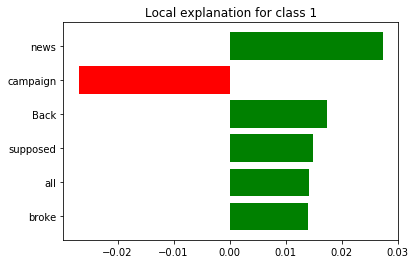

In [22]:
import matplotlib

%matplotlib inline
fig = exp.as_pyplot_figure()

In [23]:
exp.show_in_notebook(text=True)

In [24]:
news_df

,id,label,alpha,text
0,0,0,a,"On Saturday, September 17 at 8:30 pm EST, an e..."
1,1,0,a,Less than a day after protests over the police...
2,2,0,a,"Obama To UN: ‘Giving Up Liberty, Enhances Secu..."
3,3,0,a,Getty Images Wealth Of Nations Trump vs. Clint...
4,4,0,a,President Obama today vetoed a bill that would...
...,...,...,...,...
177,177,1,a,Hillary’s TOP Donor Country Just Auctioned Off...
178,178,1,a,Advertisement - story continues below The fir...
179,179,1,a,Well THAT’S Weird. If the Birther movement is ...
180,180,1,a,There’s a lot to be discussed about last nig...


In [25]:
89+91

180

In [50]:
text = news_df.iloc[180,3]
text

'  There’s a lot to be discussed about last night’s debate between Hillary Clinton and Donald Trump. One thing that has baffled many is how Hillary seemed so ready with answers and detailed facts and, almost as bizarrely, she didn’t cough or reach for water once.  Well, this twitter user might have an answer. Do you see it?  I think we all know why #TrumpWon pic.twitter.com/nwZRxvkX81 — USA For Trump 2016 (@USAforTrump2016) September 27, 2016  This wouldn’t be the first time Hillary had to use a device for help. What do you think? Is just a trick of light and shadows? A zipper? Or was Hillary actually hiding a “Cough prevention machine” in her pantsuit?  Will you support Donald Trump, Hillary Clinton or another candidate? Share your thoughts!  And LIKE this page for the latest TRUMP news. Interested in stopping Hillary? LIKE this page'

In [27]:
exp = explainer.explain_instance(text, model.predict_proba, num_features=10)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


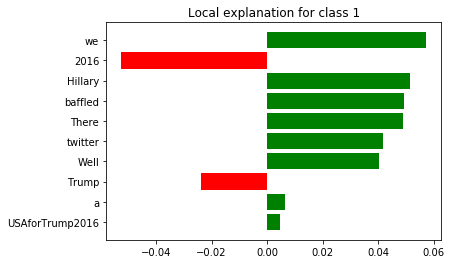

In [28]:
fig = exp.as_pyplot_figure()

In [51]:
exp = explainer.explain_instance(text, model.predict_proba, num_features=5)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


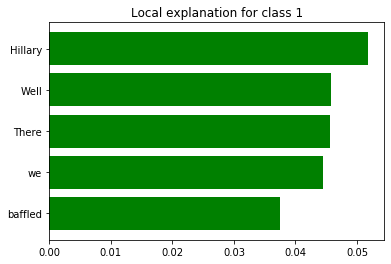

In [52]:
fig = exp.as_pyplot_figure()

In [29]:
exp.show_in_notebook(text=True)

In [30]:
38+91

129

In [53]:
text = news_df[news_df['text'].str.contains("Weird")]
text

,id,label,alpha,text
179,179,1,a,Well THAT’S Weird. If the Birther movement is ...


In [32]:
exp = explainer.explain_instance(text.iloc[0,3], model.predict_proba, num_features=10)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


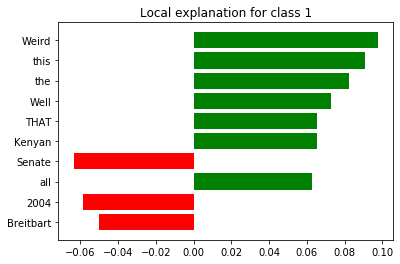

In [33]:
fig = exp.as_pyplot_figure()

In [54]:
exp = explainer.explain_instance(text.iloc[0,3], model.predict_proba, num_features=5)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


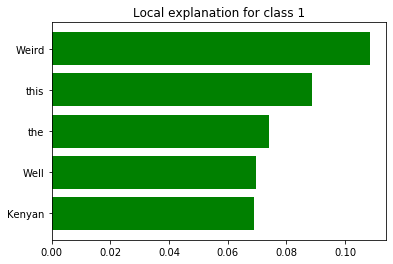

In [55]:
fig = exp.as_pyplot_figure()

In [57]:
exp.show_in_notebook(text=True)

In [40]:
text = news_df[news_df['text'].str.contains("Health Access Initiative")]
text

,id,label,alpha,text
92,92,1,a,Former President Bill Clinton and his Clinton ...
159,159,1,a,"Over the past several months, the American pub..."
162,162,1,a,New Clinton Foundation SCANDAL Just Broke – Th...


In [41]:
exp = explainer.explain_instance(text.iloc[2,3], model.predict_proba, num_features=10)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


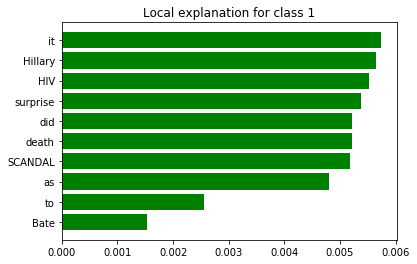

In [42]:
fig = exp.as_pyplot_figure()

In [44]:
exp.show_in_notebook(text=True)

In [45]:
exp = explainer.explain_instance(text.iloc[2,3], model.predict_proba, num_features=5)

/usr/local/lib/python3.6/dist-packages/lime/lime_text.py:116: FutureWarning: split() requires a non-empty pattern match.
  self.as_list = [s for s in splitter.split(self.raw) if s]


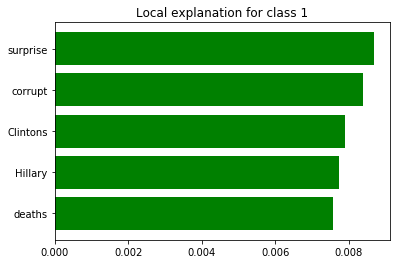

In [46]:
fig = exp.as_pyplot_figure()

In [56]:
exp.show_in_notebook(text=True)